In [1]:
!pip install soundfile librosa


In [2]:
import numpy as np
import soundfile as sf
from matplotlib import pyplot as plt
import librosa as rosa
import csv
import IPython


In [3]:
#####
# 
# 
# 
# setup song
###########################

# [song,samplerate] = rosa.load('FurElise_Slow.mp3')
song,sr = rosa.load('FurElise_Slow.mp3',mono=True,sr=None)
# print(f'number of channels in audio : {song.shape[1]}')
# print(f'number of total samples in audio: {song.shape[0]}')

length = len(song) / sr
time = np.linspace(0, length, len(song)) 
print(f"length of the song= {length} [sec]")

sr*=4 ##speed up the song,original very slow

IPython.display.Audio("FurElise_Slow.mp3")

/var/folders/5m/x3rckfmj25jb6n2mt81q4_hm0000gn/T/ipykernel_19924/4211754536.py:9: UserWarning: PySoundFile failed. Trying audioread instead.
  song,sr = rosa.load('FurElise_Slow.mp3',mono=True,sr=None)


length of the song= 343.2373696145125 [sec]


In [4]:
# ##### I used to have 2-Channels but now I use another library so it changes to mono automaticlly
# # 
# # 
# # 
# # two-channels handling
# ###########################

# f, (ax1, ax2) = plt.subplots(2, 1,figsize=(7,10))
# ax1.plot(time, song[:,0],label="Left channel",color='orange')
# ax1.set_title('Left Channel')
# ax1.set_xlabel('Time [s]')
# ax1.set_ylabel('Amplitude')
# ax2.plot(time, song[:, 1], label="Right channel",color='yellow')
# ax2.set_xlabel('Time [s]')
# ax2.set_title('Right Channel')
# ax2.set_ylabel('Amplitude')

# f.legend(loc=4)



# ## I would like to consider both channel as one so we would avg them 
# song_avgd = np.mean(song,axis=1,dtype=np.double)


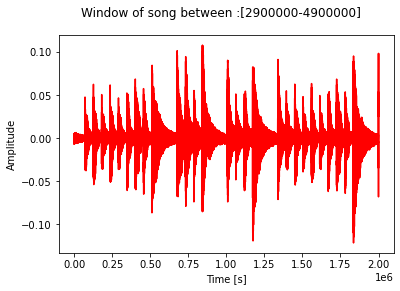

In [5]:

#####
# 
# 
# 
# window song
###########################

t1,t2 = int(2.9e6),int(4.9e6) ##parameters based on sepsific song 
n = len(song)
song_wnd = song[t1:t2] ##ive taken a window from the song
time = np.linspace(start=t1, stop=t2, num=n,dtype=np.int64) 

f1 = plt.figure()
ax3 = f1.add_subplot(111)
ax3.set_xlabel('Time [s]')
ax3.set_ylabel('Amplitude')
ax3.plot(song_wnd,color='red')
f1.suptitle(f'Window of song between :[{t1}-{t2}]')
plt.show()

sf.write('FurElise_Slow_wnd.wav',song_wnd,sr) ##mono file



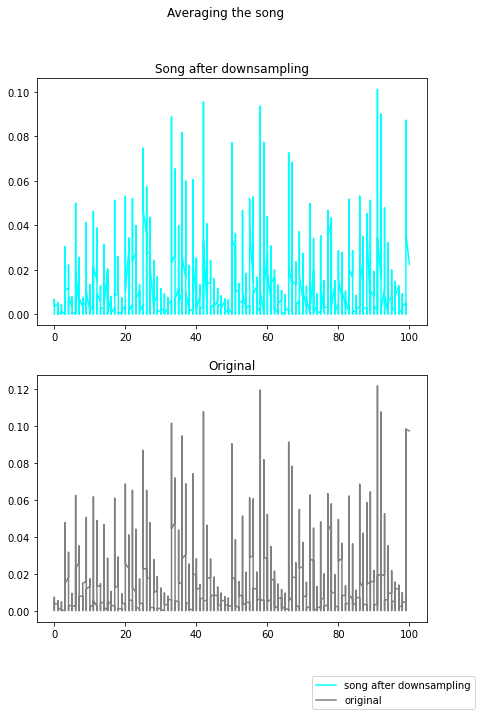

In [6]:
#####
# 
# 
# 
# downsample by m
###########################
n=len(song_wnd)
m = 20
samplerate_m = sr//m
p = n//m

y_avg = np.zeros(p)
for i in range(1,p):
    y_avg[i] = np.mean(song_wnd[m*(i-1)+1:m*i])



f3, axs45 = plt.subplots(2, 1,figsize=(7,10))

axs45[0].plot(np.linspace(0,100,p,dtype=np.int64),abs(y_avg),label='song after downsampling',color='cyan')
axs45[0].set_title('Song after downsampling')

axs45[1].plot(np.linspace(0,100,n,dtype=np.int64),abs(song_wnd),label='original',color='gray')
axs45[1].set_title('Original')

f3.suptitle('Averaging the song')
f3.legend(loc=4)

plt.show()

sf.write('FurElise_Slow_downsampled.wav',y_avg,samplerate_m) ##mono file written averaged



IPython.display.Audio("FurElise_Slow_downsampled.wav")

/Users/talsagie-private/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/talsagie-private/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


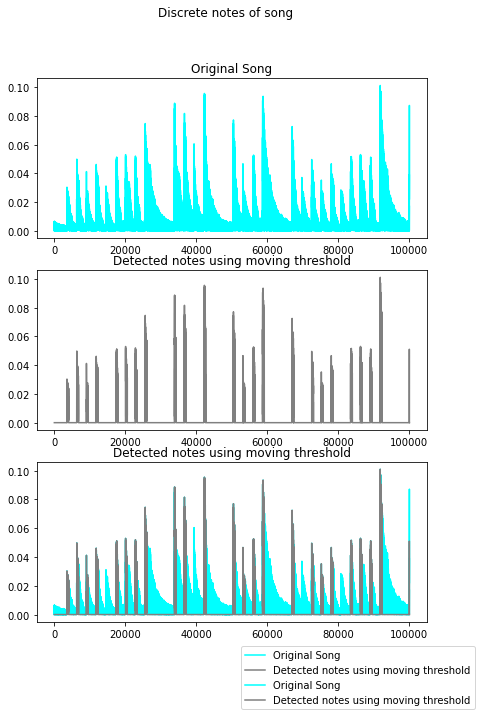

In [7]:
#####
# 
# 
# 
# threshold to find notes
###########################


y_thresh = np.zeros(p)
i = 0
while (i < p):
    thresh = 5*np.mean(np.abs(y_avg[max(1,i-5000):i]))
    if np.abs(y_avg[i]) > thresh:
        for j in range(0,500):
            if i + j <= p:
                y_thresh[i] = y_avg[i]
                i +=1
            
        
        i += 1400
    
    i += 1



f4, axs67 = plt.subplots(3, 1,figsize=(7,10))

axs67[0].plot(abs(y_avg),label='Original Song',color='cyan')
axs67[0].set_title('Original Song')

axs67[1].plot(abs(y_thresh),label='Detected notes using moving threshold',color='gray')
axs67[1].set_title('Detected notes using moving threshold')

axs67[2].plot(abs(y_avg),label='Original Song',color='cyan')
axs67[2].plot(abs(y_thresh),label='Detected notes using moving threshold',color='gray')
axs67[2].set_title('Detected notes using moving threshold')
f4.suptitle('Discrete notes of song')
f4.legend(loc=4)

plt.show()

sf.write('FurElise_Slow_after_threshold.wav',y_avg,samplerate_m) 


IPython.display.Audio("FurElise_Slow_after_threshold.wav")

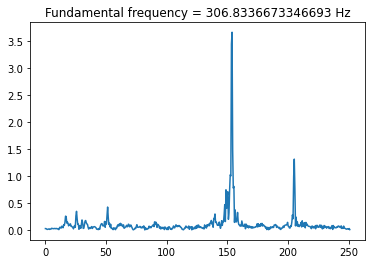

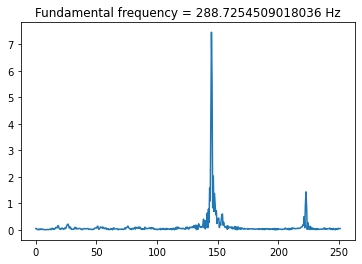

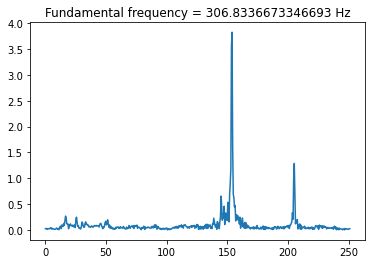

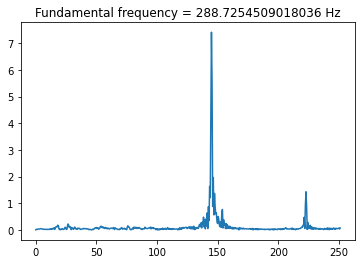

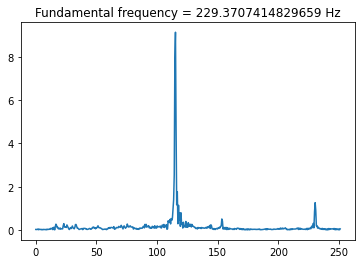

...

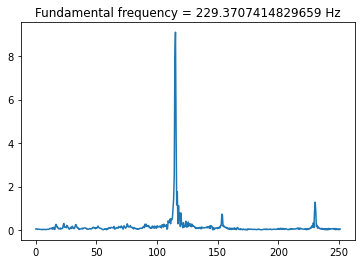

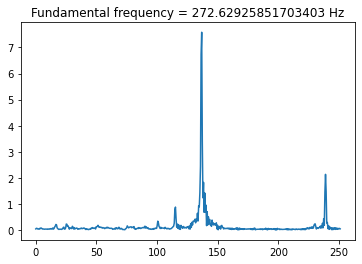

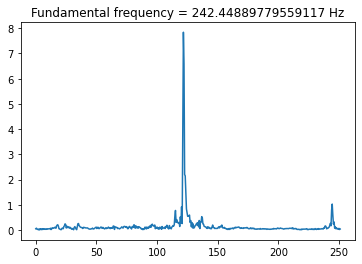

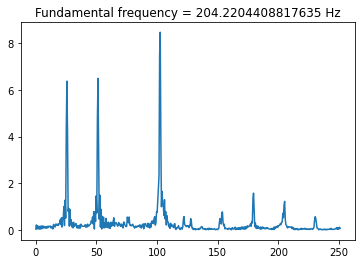

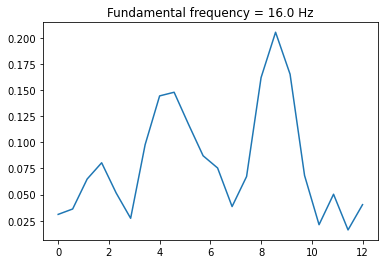

In [8]:
# #####
# # 
# # 
# # 
# # find frequencies of each note
# ###########################


i = 0
i_note = 0
fundamentals = np.zeros(p)
note = np.zeros(p)

while i < p:
    j = 1
    end_note = 0
    while (((y_thresh[i] != 0) or (end_note > 0)) and (i < p)):
        note[j] = y_thresh[i]
        i = i + 1
        j = j + 1
        if y_thresh[i] != 0: 
            end_note = 20 ####this is our window size we want to make sure we have at least minmum of 20 frames of silence
        else:
            end_note -= 1  ##this way we make sure that we actually have 20 frames of silence
        
        if end_note == 0: ##if we really reached silence and found a note
           if j > 25: ##if number of samples for this note is at least 25 means its meaningful 
               note_padded = np.pad(np.trim_zeros(note),j//2) ##pad note with zeros to double size
               Note = np.fft.fft(note_padded) ##run FFT on note padded
               Ns = len(np.trim_zeros(note))  ##number of samples
               f = np.linspace(0,(1+Ns/2),Ns)##this is the domian of plot 
               index = np.argmax(np.abs(Note[1:len(f)]))  ##Find the index of max elemnt from fft 
               i_note += 1 ##we found a note
               fundamentals[i_note] = f[index]*2 ##we put it on fundamentals and it requals twice the np linspce we made
               plt.plot(f,np.abs(Note[:len(f)])) ##plot
               plt.title('Fundamental frequency = '+str(fundamentals[i_note])+' Hz')
               plt.show()
           note[:] = 0
           break

        

    i += 1


In [9]:

def FreqToNote(f):
    ## to each of our frequency we assiagn a note 
	index = round(17.31232*np.log(f)-47)
	frequencies = [16.35, 17.32, 18.35, 19.45, 20.6, 21.83, 23.12, 24.5, 25.96, 27.5, 29.14, 30.87, 32.7, 34.65, 36.71, 38.89, 41.2, 43.65, 46.25, 49, 51.91, 55, 58.27, 61.74, 65.41, 69.3, 73.42, 77.78, 82.41, 87.31, 92.5, 98, 103.83, 110, 116.54, 123.47, 130.81, 138.59, 146.83, 155.56, 164.81, 174.61, 185, 196, 207.65, 220, 233.08, 246.94, 261.63, 277.18, 293.66, 311.13, 329.63, 349.23, 369.99, 392 ,415.3, 440, 466.16, 493.88, 523.25, 554.37, 587.33, 622.25, 659.25, 698.46, 739.99, 783.99, 830.61, 880, 932.33, 987.77 ,1046.5 ,1108.73 ,1174.66, 1244.51, 1318.51 ,1396.91 ,1479.98 ,1567.98 ,1661.22 ,1760 ,1864.66 ,1975.53, 2093 ,2217.46, 2349.32, 2489.02 ,2637.02 ,2793.83, 2959.96, 3135.96, 3322.44, 3520, 3729.31, 3951.07, 4186.01, 4434.92 ,4698.63 ,4978.03, 5274.04, 5587.65, 5919.91, 6271.93 ,6644.88, 7040, 7458.62, 7902.13]
	notes = ["C0","Db0","D0","Eb0","E0" ,"F0", "Gb0" ,"G0" ,"Ab0", "A0" ,"Bb0" ,"B0" ,"C1" ,"Db1", "D1" ,"Eb1", "E1", "F1" ,"Gb1", "G1" ,"Ab1", "A1", "Bb1", "B1" ,"C2" ,"Db2", "D2", "Eb2", "E2" ,"F2", "Gb2", "G2" ,"Ab2", "A2" ,"Bb2" ,"B2" ,"C3" ,"Db3" ,"D3" ,"Eb3" ,"E3" ,"F3", "Gb3" ,"G3", "Ab3" ,"A3" ,"Bb3", "B3" ,"C4" ,"Db4", "D4", "Eb4" ,"E4" ,"F4", "Gb4", "G4", "Ab4" ,"A4" ,"Bb4", "B4" ,"C5", "Db5", "D5", "Eb5" ,"E5" ,"F5" ,"Gb5" ,"G5" ,"Ab5", "A5", "Bb5", "B5", "C6" ,"Db6" ,"D6", "Eb6" ,"E6" ,"F6" ,"Gb6", "G6" ,"Ab6", "A6", "Bb6", "B6" ,"C7", "Db7" ,"D7", "Eb7", "E7" ,"F7", "Gb7" ,"G7", "Ab7", "A7", "Bb7" ,"B7", "C8", "Db8" ,"D8", "Eb8" ,"E8" ,"F8" ,"Gb8", "G8", "Ab8", "A8" ,"Bb8", "B8"]
	note = notes[index]
	freq = frequencies[index]
	return note,freq




In [10]:

# #####
# # 
# # 
# # 
# # rewrite song and notes to csv
# ###########################
f = open('notes_file', 'w')
writer = csv.writer(f)

amp = 1
fs = 20500  #sampling frequency
duration = 0.5
recreate_song = np.zeros(int(duration*fs*len(fundamentals)))
fundamentals = np.trim_zeros(fundamentals)
for i in range(1,len(fundamentals)):
    letter,freq= FreqToNote(fundamentals[i])
    writer.writerow(letter)
    values = np.arange(0,0.5,1/fs)
    a = amp*np.sin(2*np.pi*freq*values*2)
    recreate_song[int((i-1)*fs*duration+1):int(i*fs*duration+1)] = a
f.close()
sf.write('fur_elise_done.wav',recreate_song,fs)



IPython.display.Audio("fur_elise_done.wav")

In [11]:
IPython.display.Audio("fur_elise_done.wav")

# Notes are in a sepreated csv file called notes.csv 